In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import numpy as np
warnings.filterwarnings('ignore')

In [2]:
wine = pd.read_csv('winequalityN.csv')

In [3]:
wine.sample(10)

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
4062,white,7.4,0.36,0.32,1.90,0.036,27.0,119.0,0.99196,3.15,0.49,11.20,6
4869,white,6.6,0.24,0.33,10.10,0.032,8.0,81.0,0.99626,3.19,0.51,9.80,6
4019,white,6.2,0.32,0.12,4.80,0.054,6.0,97.0,0.99424,3.16,0.50,9.30,5
6344,red,6.9,0.63,0.02,1.90,0.078,18.0,30.0,0.99712,3.40,0.75,9.80,5
213,white,6.7,0.13,0.29,5.30,0.051,31.0,122.0,0.99440,3.44,0.37,9.70,6
4553,white,5.7,0.28,0.30,3.90,0.026,36.0,105.0,0.98963,3.26,0.58,12.75,6
2492,white,6.1,0.28,0.24,19.95,0.074,32.0,174.0,0.99922,3.19,0.44,9.30,6
1157,white,7.8,0.30,0.29,16.85,0.054,23.0,135.0,0.99980,3.16,0.38,9.00,6
1454,white,8.3,0.21,0.49,19.80,0.054,50.0,231.0,1.00120,2.99,0.54,9.20,5
1776,white,6.6,0.25,0.35,14.00,0.069,42.0,163.0,0.99900,3.56,0.47,9.80,5


In [ ]:
wine.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  6497 non-null   object 
 1   fixed acidity         6487 non-null   float64
 2   volatile acidity      6489 non-null   float64
 3   citric acid           6494 non-null   float64
 4   residual sugar        6495 non-null   float64
 5   chlorides             6495 non-null   float64
 6   free sulfur dioxide   6497 non-null   float64
 7   total sulfur dioxide  6497 non-null   float64
 8   density               6497 non-null   float64
 9   pH                    6488 non-null   float64
 10  sulphates             6493 non-null   float64
 11  alcohol               6497 non-null   float64
 12  quality               6497 non-null   int64  
dtypes: float64(11), int64(1), object(1)
memory usage: 660.0+ KB


In [ ]:
# wine['type'].value_counts()
wine['type'].value_counts(normalize=True)

white    0.753886
red      0.246114
Name: type, dtype: float64

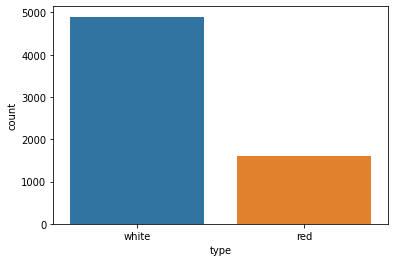

In [ ]:
sns.countplot(x='type',data=wine)

In [ ]:
wine['quality'].value_counts()

6    2836
5    2138
7    1079
4     216
8     193
3      30
9       5
Name: quality, dtype: int64

In [4]:
wine.isna().sum()

type                     0
fixed acidity           10
volatile acidity         8
citric acid              3
residual sugar           2
chlorides                2
free sulfur dioxide      0
total sulfur dioxide     0
density                  0
pH                       9
sulphates                4
alcohol                  0
quality                  0
dtype: int64

In [5]:
wine.update(wine.fillna(wine.mean()))

In [6]:
wine.isnull().sum()

type                    0
fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 21.9 MB 6.0 MB/s 
     |████████████████████████████████| 596 kB 5.2 MB/s 
     |████████████████████████████████| 102 kB 53.0 MB/s 
     |████████████████████████████████| 690 kB 43.6 MB/s 
     |████████████████████████████████| 4.7 MB 38.5 MB/s 
     |████████████████████████████████| 62 kB 61 kB/s 
     |████████████████████████████████| 812 kB 50.4 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.2.0-py2.py3-none-any.whl size=261257 sha256=71e1b376d82bc50e240e344aaa2c9fa941f0635d97129afa49568a75685cebec
  Stored in directory: /tmp/pip-ephem-wheel-cache-0omqirlm/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=078ad871968afda99b96282f91de2cf4a5cf61c96f81eddc0ca30ca914fe3fde
  Stored in directory: /root/.cache/pip/wheel

In [ ]:
from pandas_profiling import ProfileReport

In [ ]:
profile = ProfileReport(wine , title='Wine Quality', html={'style':{'style':True}})

In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
wine.duplicated().sum()

1168

In [8]:
wine.drop_duplicates(inplace=True)

In [9]:
wine.shape

(5329, 13)

In [10]:
X=wine.iloc[:-1]
y=wine.iloc[-1]

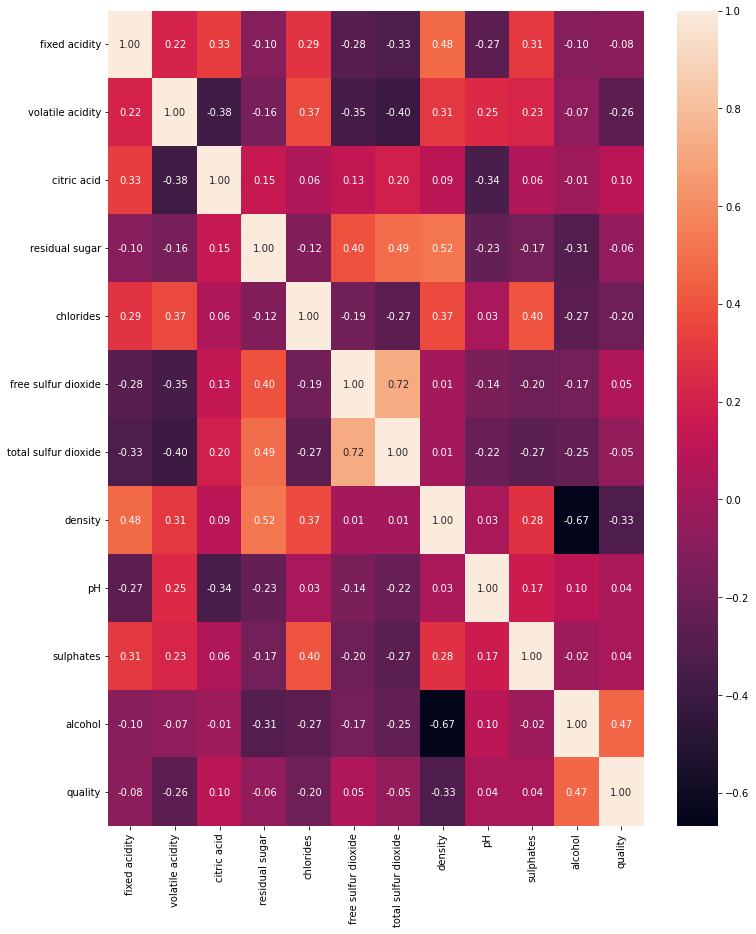

In [14]:
plt.figure(figsize=(12,15))
sns.heatmap(wine.corr(),annot=True,fmt="0.2f")

In [16]:
wine.corr()['quality']

fixed acidity          -0.080554
volatile acidity       -0.264212
citric acid             0.098764
residual sugar         -0.057253
chlorides              -0.202312
free sulfur dioxide     0.054456
total sulfur dioxide   -0.050387
density                -0.326978
pH                      0.039946
sulphates               0.041396
alcohol                 0.469555
quality                 1.000000
Name: quality, dtype: float64

In [18]:
wine.drop(['density','total sulfur dioxide'],inplace=True,axis=1)

In [19]:
wine.sample(10)

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,pH,sulphates,alcohol,quality
1288,white,7.2,0.32,0.33,1.4,0.029,29.0,3.15,0.51,12.8,7
21,white,6.4,0.31,0.38,2.9,0.038,19.0,3.17,0.35,11.0,7
6286,red,6.6,0.64,0.31,6.1,0.083,7.0,3.35,0.68,10.3,5
4386,white,6.0,0.27,0.31,5.0,0.043,54.0,3.28,0.52,11.0,6
3270,white,6.4,0.15,0.29,1.8,0.044,21.0,3.10,0.38,10.2,5
1096,white,6.5,0.28,0.26,8.8,0.040,44.0,3.32,0.37,10.2,6
4446,white,4.4,0.46,0.10,2.8,0.024,31.0,3.48,0.34,13.1,6
5922,red,7.7,0.58,0.01,1.8,0.088,12.0,3.32,0.56,10.5,7
4291,white,7.2,0.21,0.36,15.7,0.045,68.0,3.25,0.76,9.4,5
808,white,6.0,0.39,0.17,12.0,0.046,65.0,3.15,0.38,9.0,6


In [21]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(wine.iloc[:,:-1], wine.iloc[:,-1], test_size = 0.2, stratify = wine.iloc[:,-1])

In [22]:
from math import remainder
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
transformer = ColumnTransformer(transformers=[('tnf1',OneHotEncoder(sparse=False,drop='first'),['type'])],remainder='passthrough')


In [25]:
X_train = transformer.fit_transform(X_train)
X_test = transformer.transform(X_test)

In [27]:
from sklearn.preprocessing import StandardScaler

scaler=StandardScaler()

scaler.fit(X_train)

X_train_sc = scaler.transform(X_train)
X_test_sc = scaler.transform(X_test)


In [47]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
rfg = RandomForestRegressor()


rfg.fit(X_train,y_train)

y_pred=rfg.predict(X_test)

In [48]:
y_pred

array([6.92, 5.93, 5.99, ..., 6.61, 6.29, 5.26])

In [49]:
np.around(y_pred)

array([7., 6., 6., ..., 7., 6., 5.])

In [50]:
from sklearn.metrics import mean_squared_error
mean_squared_error(y_test,np.around(y_pred))

0.5900562851782364

In [51]:
from sklearn.model_selection import cross_val_score
rfg_eval = cross_val_score(estimator = rfg, X = X_train, y = y_train, scoring='neg_mean_squared_error', cv = 10)
rfg_eval.mean()

-0.48853441655396856

In [52]:
rfg_eval

array([-0.5074192 , -0.48527541, -0.53489087, -0.47857887, -0.44770962,
       -0.54564836, -0.48909695, -0.44825164, -0.46941174, -0.4790615 ])